# Registration of PCA Images
#### July 18, 2022

- Annotates points for each replicate of the 3 slices
- Performs registration under 3 different conditions, varying the sigmaM value each time

In [1]:
import numpy as np
%matplotlib notebook
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import cm
from matplotlib.lines import Line2D
import os
import glob
import torch

from matplotlib.colors import ListedColormap
from scipy.stats import rankdata
import nrrd
import time

import tools
import time
import datetime

import imp
imp.reload(tools)

/nafs/dtward/torch_venv/lib/python3.7/site-packages/ipykernel_launcher.py:20: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses


<module 'tools' from '/ifshome/oamiuwu/rasterization_work/tools.py'>

In [2]:
data = [0]*9

names = ['S1R1','S1R2','S1R3','S2R1','S2R2','S2R3','S3R1','S3R2','S3R3']

for i in range(9):
    data[i] = np.load(f"/nafs/dtward/stalign/pca/{names[i]}_arrays.npz")

data[0].files

['X', 'Y', 'W', 'V', 'Z', 'I_pca', 'I_rgb', 'screefig', 'rgbfig']

## Finding Slice 1 Points
#### Reference: Image 90
https://atlas.brain-map.org/

- RSP_L/RSP_R: Turning point of retrosplenial area
- SCzo: center of "dip" in superior colliculus
- POST_L/POST_R: ventral/medial-most part of postsubiculum
- P: follow the outline of the midbrain to the most ventral part; should be fairly center (point is actually a part of the pons)
- DG_L/DG_R: ventral-most tip of dentate gyrus
- ENTm1_L/ENTm1_R: tip of transition between entorhinal area, medial part, layer 1 and HATA
- CTXpl_L/CTXpl_R: lateral-most part of cortical plate

Note: all left/right point pairs are reversed, i.e. the L point should be the R point and vice versa

In [3]:
# row/col order
points_s1r1 = np.array([[28,156],[34,193],[49,168],[84,109],[106,234],[193,163],
                       [171,99],[172,237],[195,86],[199,249],[126,43],[134,289]])
points_s1r2 = np.array([[160,58],[121,82],[149,83],[228,84],[112,153],[213,202],
                       [271,165],[158,233],[292,177],[161,254],[300,82],[71,218]])
points_s1r3 = np.array([[102,79],[78,106],[102,103],[166,82],[83,185],[198,207],
                       [233,155],[141,248],[255,160],[144,270],[239,66],[56,243]])

names_s1 = ["RSP_L","RSP_R","SCzo","POST_L","POST_R","P",
            "DG_L","DG_R","ENTm1_L","ENTm1_R","CTXpl_L","CTXpl_R"]

"""fig,ax = plt.subplots()
ax.imshow(data[0]['I_rgb'][:,:,:3])
ax.set_title(names[0])
ax.scatter(points_s1r1[:,1],points_s1r1[:,0])

fig,ax = plt.subplots()
ax.imshow(data[1]['I_rgb'][:,:,:3])
ax.set_title(names[1])
ax.scatter(points_s1r2[:,1],points_s1r2[:,0])

fig,ax = plt.subplots()
ax.imshow(data[2]['I_rgb'][:,:,:3])
ax.set_title(names[2])
ax.scatter(points_s1r3[:,1],points_s1r3[:,0])"""

"fig,ax = plt.subplots()\nax.imshow(data[0]['I_rgb'][:,:,:3])\nax.set_title(names[0])\nax.scatter(points_s1r1[:,1],points_s1r1[:,0])\n\nfig,ax = plt.subplots()\nax.imshow(data[1]['I_rgb'][:,:,:3])\nax.set_title(names[1])\nax.scatter(points_s1r2[:,1],points_s1r2[:,0])\n\nfig,ax = plt.subplots()\nax.imshow(data[2]['I_rgb'][:,:,:3])\nax.set_title(names[2])\nax.scatter(points_s1r3[:,1],points_s1r3[:,0])"

## Finding Slice 2 Points
#### Reference: Image 67
https://atlas.brain-map.org/
- RSPd1_L/RSPd1_R: Turning point for retrospenial area, dorsal part, layer 1
- V3: In line with RSPv1 (the two most dorsal lines) and with the most ventral part of hippocampal formation (sunglasses)
- CA3_L/CA3_R: Turing point of lateral-most part of CA3
- ARH: center of arcuate hypothalamic nucleus
- VPL_L/VPL_R: lateral-most part of ventral posterolateral nucleus of the thalamus (had to extrapolate in some areas so keep smooth curve)
  - Wanted to do reticular nucleus (RT) be could not be clearly seen in each image
- ec_L/ec_R: follow the corpus callosum body (ccb) to the lateral-most part where it becomes the external capsule (should be slightly ventral to VPL points)
- dg_L/dg_R: follow hippocampal formation from dorsal to ventral until distinct color change. point should be at the last part of the initial color (centered at the beginning of what looks like an alligator's mouth)
- TH: ventral-most part of thalamus

In [4]:
# row/col order
#instructions descriptive enough for someone else to identify same points
points_s2r1 = np.array([[22,179],[29,205],[95,169],[71,128],[102,228],[224,136],
                       [115,104],[150,220],[105,54],[182,264],[87,149],[99,197],[183,149]])
points_s2r2 = np.array([[250,240],[268,222],[210,179],[165,242],[264,144],[100,102],
                       [130,214],[221,115],[93,247],[245,62],[180,208],[230,158],[135,132]])
points_s2r3 = np.array([[233,173],[231,146],[166,166],[182,227],[167,101],[36,175],
                       [141,231],[126,104],[121,282],[112,55],[169,201],[164,132],[78,172]])

#L = left side of IMAGE, R = right side of IMAGE - talk to Jean
names_s2 = ["RSPd1_L","RSPd1_R","V3","CA3_L","CA3_R","ARH",
            "VPL_L","VPL_R", "ec_L", "ec_R","dg_L","dg_R","TH"]

"""fig,ax = plt.subplots()
ax.imshow(data[3]['I_rgb'][:,:,:3])
ax.set_title(names[3])
ax.scatter(points_s2r1[:,1],points_s2r1[:,0])

fig,ax = plt.subplots()
ax.imshow(data[4]['I_rgb'][:,:,:3])
ax.set_title(names[4])
ax.scatter(points_s2r2[:,1],points_s2r2[:,0])

fig,ax = plt.subplots()
ax.imshow(data[5]['I_rgb'][:,:,:3])
ax.set_title(names[5])
ax.scatter(points_s2r3[:,1],points_s2r3[:,0])"""

"fig,ax = plt.subplots()\nax.imshow(data[3]['I_rgb'][:,:,:3])\nax.set_title(names[3])\nax.scatter(points_s2r1[:,1],points_s2r1[:,0])\n\nfig,ax = plt.subplots()\nax.imshow(data[4]['I_rgb'][:,:,:3])\nax.set_title(names[4])\nax.scatter(points_s2r2[:,1],points_s2r2[:,0])\n\nfig,ax = plt.subplots()\nax.imshow(data[5]['I_rgb'][:,:,:3])\nax.set_title(names[5])\nax.scatter(points_s2r3[:,1],points_s2r3[:,0])"

## Finding Slice 3 Points
#### Reference: Image 52
https://atlas.brain-map.org/
- MOs1_L/MOs1_R: Turning point for secondary motor area, layer 1
- ccb: center of corpus callosum body in line with ACAd/ACAv (two most dorsal lines)
- CP_L_T: top rightmost part of caudoputamen
- CP_R_T: top leftmost part of caudoputamen
- och: center of optic chiasm, in line with ccb point
- CP_L_L/CP_R_L: most lateral point of caudoputamen
- OT_L_L/OT_R_L: most lateral point of olfactory tubercle
- OT_L_M/OT_R_M: most medial point of olfactory tubercle

In [5]:
# row/col order
# could not idenify landmark precisely enough for accuracy
points_s3r1 = np.array([[103,50],[90,58],[135,105],[156,85],[112,119],[194,189],
                       [223,78],[82,188],[257,139],[133,237],[214,178],[178,205]])
points_s3r2 = np.array([[28,174],[32,192],[85,176],[77,121],[94,222],[197,142],
                       [117,50],[154,266],[182,59],[214,223],[204,107],[218,166]])
points_s3r3 = np.array([[176,239],[197,223],[159,175],[141,185],[192,162],[112,71],
                       [56,176],[235,75],[46,99],[180,32],[82,76],[145,40]])

names_s3 = ["MOs1_L","MOs1_R","ccb","CP_L_T","CP_R_T","och",
            "CP_L_L","CP_R_L","OT_L_L","OT_R_L","OT_L_M","OT_R_M"]

"""fig,ax = plt.subplots()
ax.imshow(data[6]['I_rgb'][:,:,:3])
ax.set_title(names[6])
ax.scatter(points_s3r1[:,1],points_s3r1[:,0])

fig,ax = plt.subplots()
ax.imshow(data[7]['I_rgb'][:,:,:3])
ax.set_title(names[7])
ax.scatter(points_s3r2[:,1],points_s3r2[:,0])

fig,ax = plt.subplots()
ax.imshow(data[8]['I_rgb'][:,:,:3])
ax.set_title(names[8])
ax.scatter(points_s3r3[:,1],points_s3r3[:,0])"""

"fig,ax = plt.subplots()\nax.imshow(data[6]['I_rgb'][:,:,:3])\nax.set_title(names[6])\nax.scatter(points_s3r1[:,1],points_s3r1[:,0])\n\nfig,ax = plt.subplots()\nax.imshow(data[7]['I_rgb'][:,:,:3])\nax.set_title(names[7])\nax.scatter(points_s3r2[:,1],points_s3r2[:,0])\n\nfig,ax = plt.subplots()\nax.imshow(data[8]['I_rgb'][:,:,:3])\nax.set_title(names[8])\nax.scatter(points_s3r3[:,1],points_s3r3[:,0])"

images aligned to each other in pairs (6 per slice)
doing aliginment pick dimension: either density image or first three PCs
I.shape[1] = Y, I.shape[2] = X
1) try to get registration running (LDDM)  
2) apply transformation to landmark points to evaluate accuracy  
3) may try to rescale things back to physical units

torch tensor ~ np array (not exactly interchangeable)

# Run the mapping code

In [6]:
points = [points_s1r1,points_s1r2,points_s1r3,
          points_s2r1,points_s2r2,points_s2r3,
          points_s3r1,points_s3r2,points_s3r3]
points = [p*30. for p in points]

In [7]:
i=5
I = tools.normalize(data[i]['I_pca'][:3])
YI = np.array(range(I.shape[1]))*30.
XI = np.array(range(I.shape[2]))*30.

j=4
J = tools.normalize(data[j]['I_pca'][:3])
YJ = np.array(range(J.shape[1]))*30.
XJ = np.array(range(J.shape[2]))*30.

In [8]:
I.shape

(3, 256, 336)

<IPython.core.display.Javascript object>


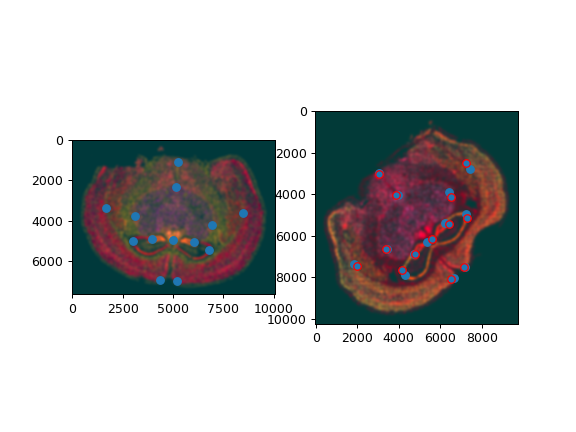

In [11]:
extentI = tools.extent_from_x((YI,XI))
extentJ = tools.extent_from_x((YJ,XJ))

L,T = tools.L_T_from_points(points[i],points[j])
ApointsI = (L@points[i].T).T + T
fig,ax = plt.subplots(1,2)
ax[0].imshow((I/np.max(I)).transpose(1,2,0),extent=extentI)
ax[1].imshow((J/np.max(J)).transpose(1,2,0),extent=extentJ)
ax[0].scatter(points[i][:,1],points[i][:,0])
ax[1].scatter(points[j][:,1],points[j][:,0])
ax[1].scatter(ApointsI[:,1],ApointsI[:,0],fc=None,ec='r')

# Comparing Registrations
v00 : gradient descent step sizes were 5eX, 100 iterations  
v01 : gradient descent step sizes changed to 2eX, 1000 iterations (best was sigma=0.2)  
v02 : LDDMM ran without points[i] and points[j] as input as control  

/nafs/dtward/torch_venv/lib/python3.7/site-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


<IPython.core.display.Javascript object>


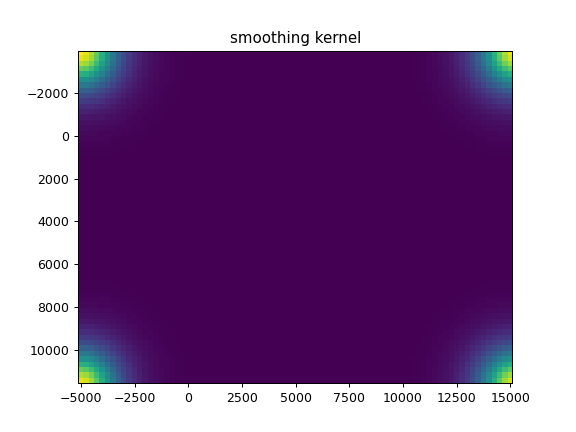

<IPython.core.display.Javascript object>


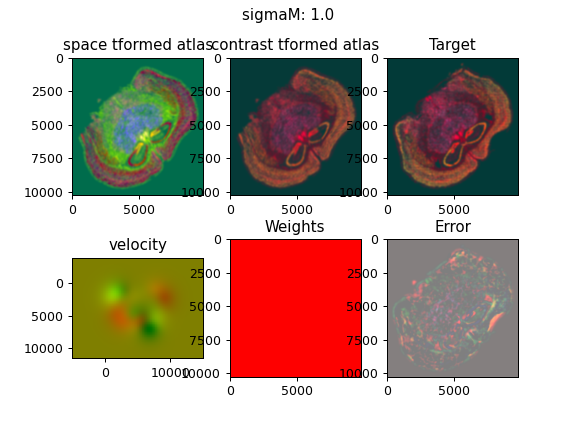

<IPython.core.display.Javascript object>


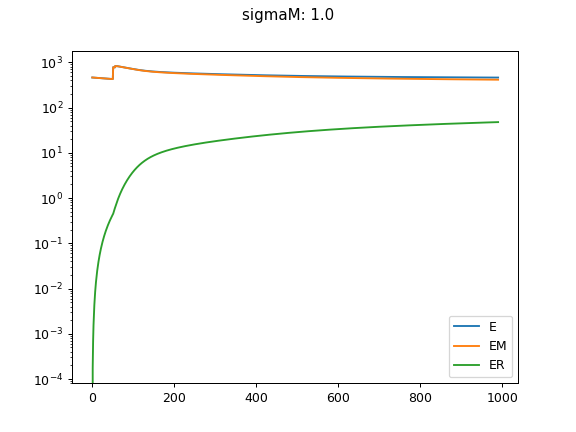

/ifshome/oamiuwu/rasterization_work/tools.py:824: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  A = torch.tensor(A)
/ifshome/oamiuwu/rasterization_work/tools.py:825: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  v = torch.tensor(v)
/ifshome/oamiuwu/rasterization_work/tools.py:837: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  XJ = torch.tensor(XJ)


<IPython.core.display.Javascript object>


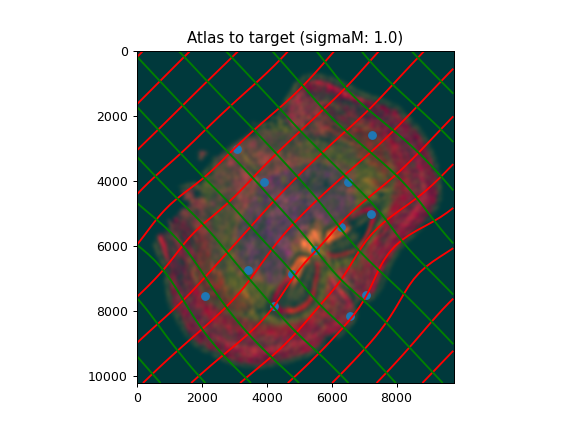

<IPython.core.display.Javascript object>


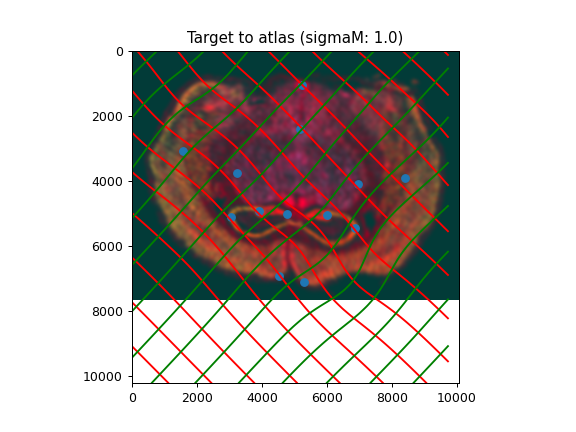

/nafs/dtward/torch_venv/lib/python3.7/site-packages/numpy/lib/npyio.py:719: FutureWarning: The input object of type 'Tensor' is an array-like implementing one of the corresponding protocols (`__array__`, `__array_interface__` or `__array_struct__`); but not a sequence (or 0-D). In the future, this object will be coerced as if it was first converted using `np.array(obj)`. To retain the old behaviour, you have to either modify the type 'Tensor', or assign to an empty array created with `np.empty(correct_shape, dtype=object)`.
  val = np.asanyarray(val)
/nafs/dtward/torch_venv/lib/python3.7/site-packages/numpy/lib/npyio.py:719: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  val = np.asanyarray(val)



sigmaM of 1.0
time: 2:10:59.739375


<IPython.core.display.Javascript object>


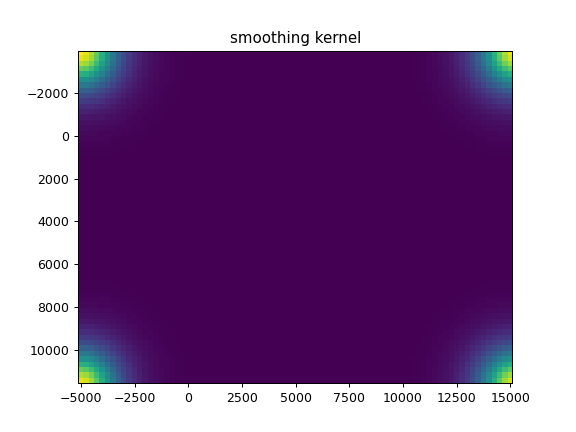

<IPython.core.display.Javascript object>


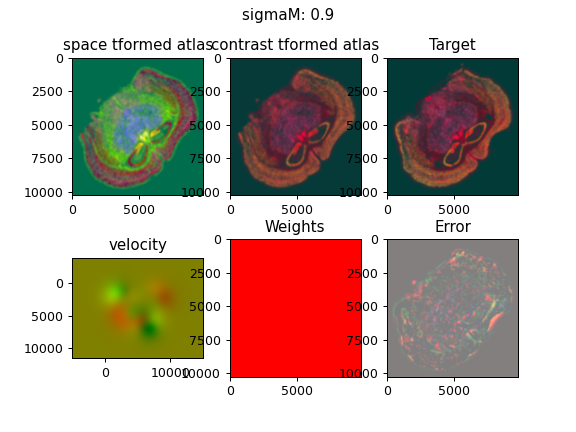

<IPython.core.display.Javascript object>


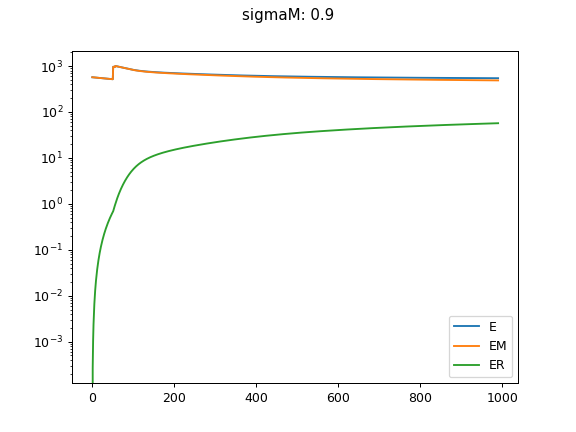

<IPython.core.display.Javascript object>


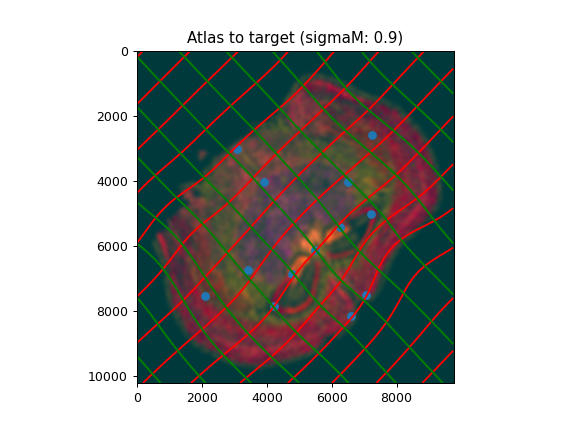

<IPython.core.display.Javascript object>


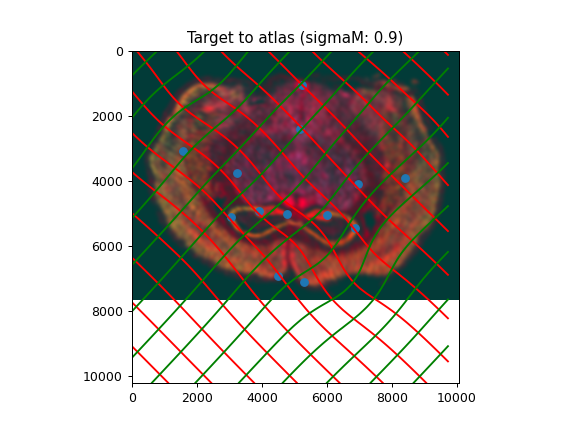


sigmaM of 0.9
time: 2:14:29.707946


<IPython.core.display.Javascript object>


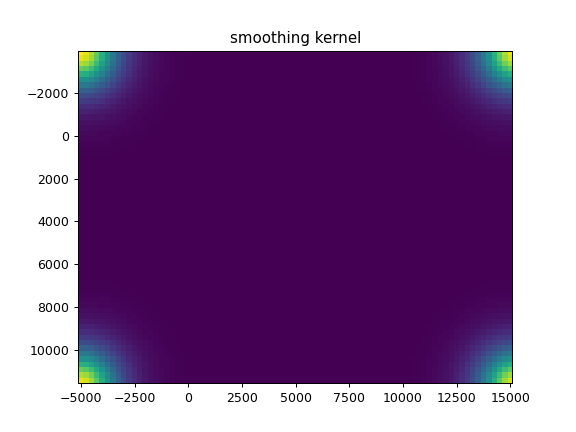

<IPython.core.display.Javascript object>


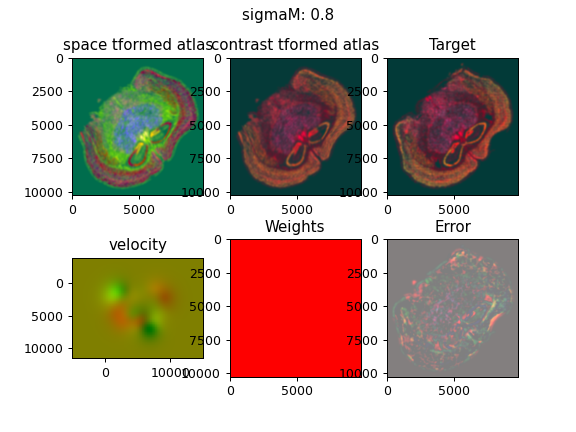

<IPython.core.display.Javascript object>


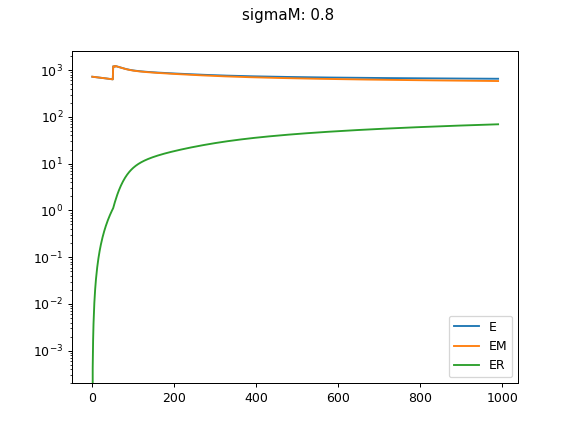

<IPython.core.display.Javascript object>


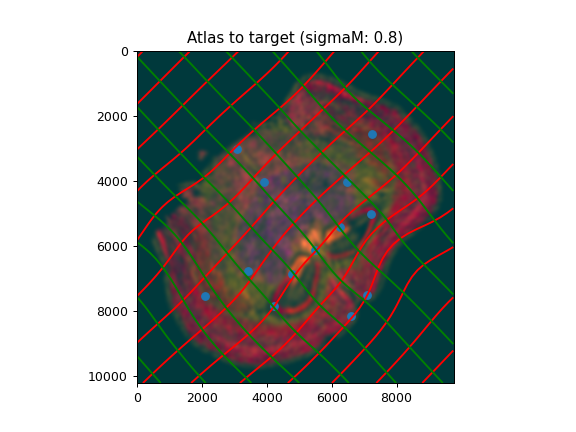

<IPython.core.display.Javascript object>


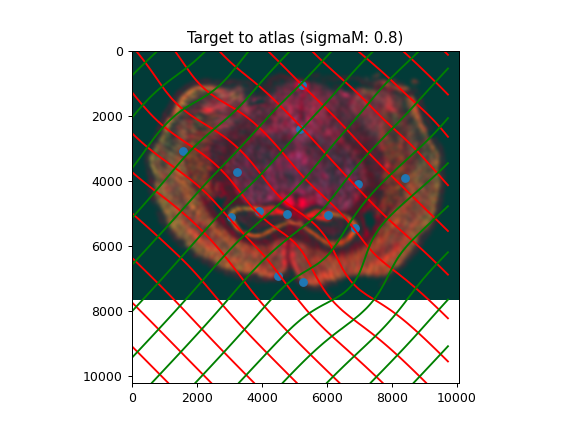


sigmaM of 0.8
time: 2:15:14.304909


<IPython.core.display.Javascript object>


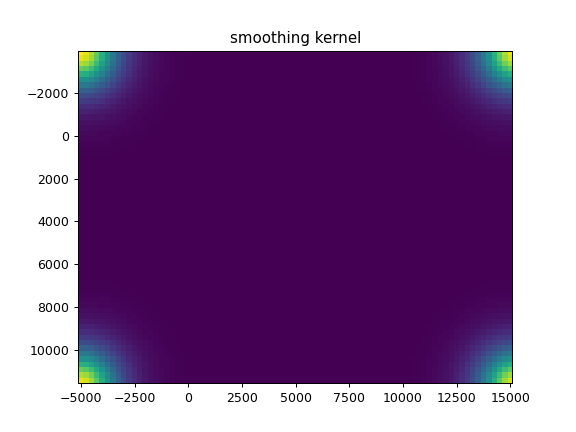

<IPython.core.display.Javascript object>


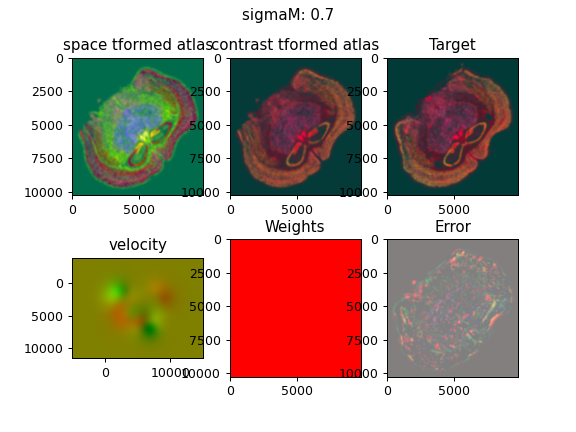

<IPython.core.display.Javascript object>


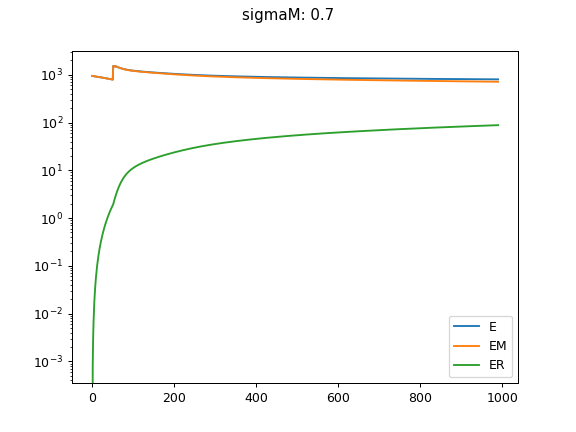

<IPython.core.display.Javascript object>


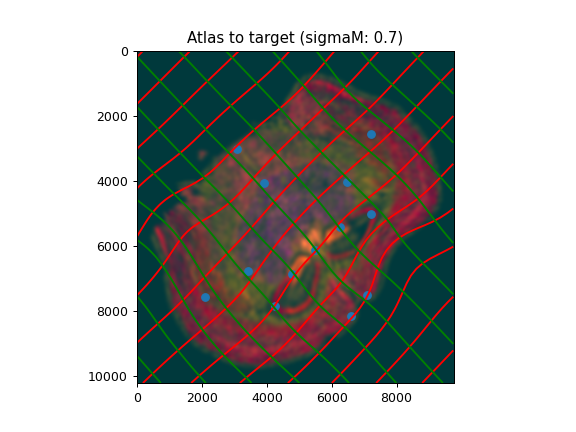

<IPython.core.display.Javascript object>


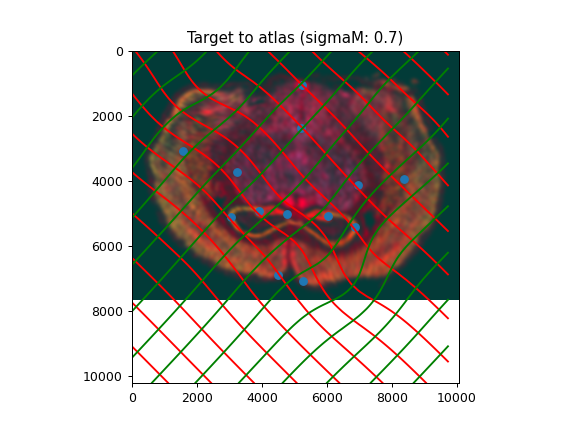


sigmaM of 0.7
time: 2:16:40.868571


/ifshome/oamiuwu/rasterization_work/tools.py:594: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots()


<IPython.core.display.Javascript object>


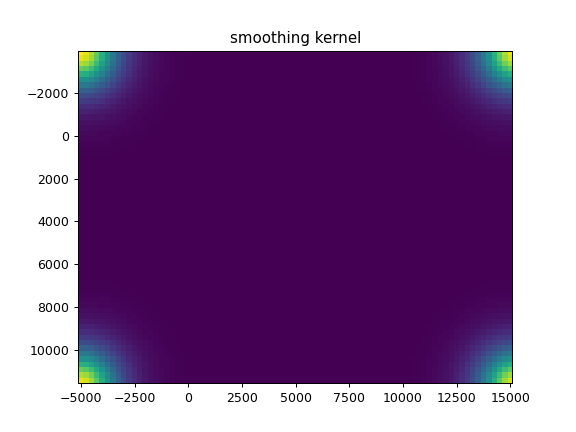

<IPython.core.display.Javascript object>


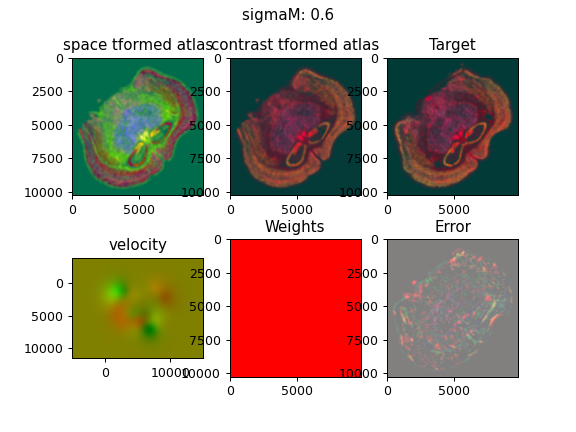

<IPython.core.display.Javascript object>


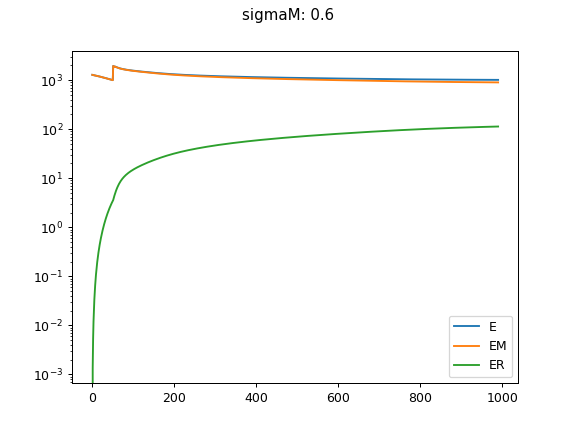

<IPython.core.display.Javascript object>


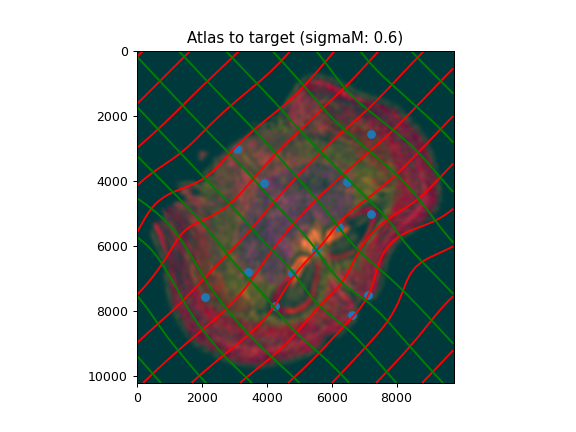

<IPython.core.display.Javascript object>


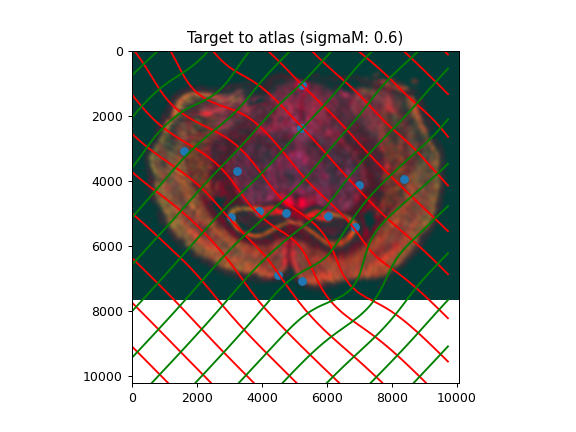


sigmaM of 0.6
time: 2:15:54.157566


<IPython.core.display.Javascript object>


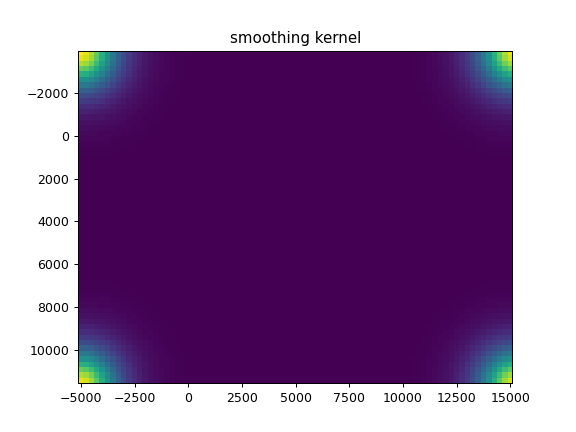

<IPython.core.display.Javascript object>


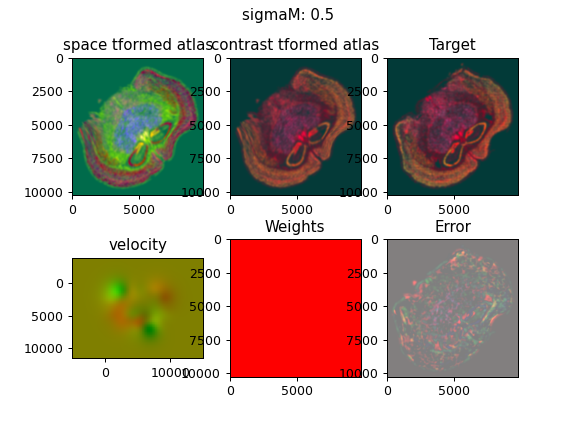

<IPython.core.display.Javascript object>


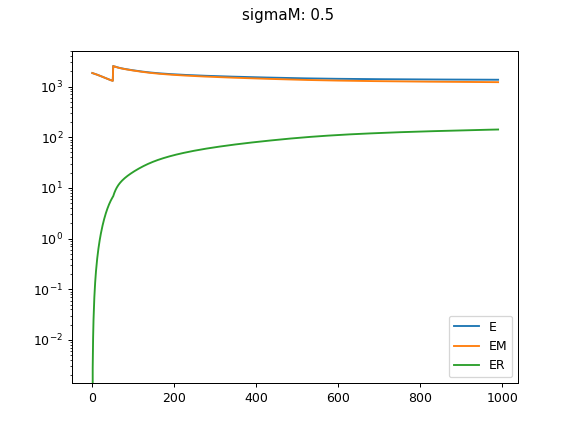

<IPython.core.display.Javascript object>


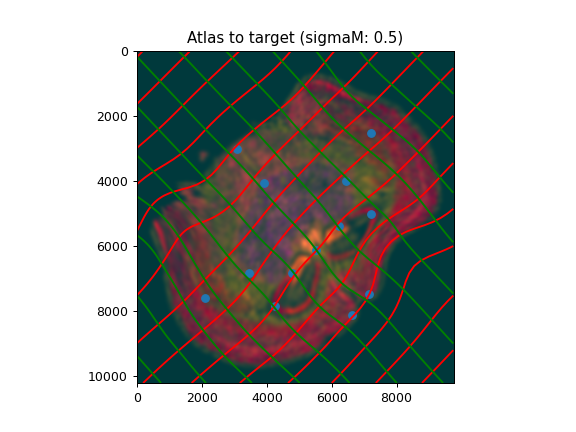

<IPython.core.display.Javascript object>


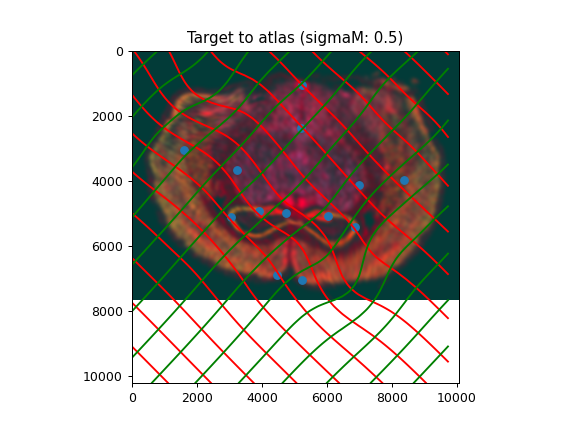


sigmaM of 0.5
time: 2:16:46.469408


<IPython.core.display.Javascript object>


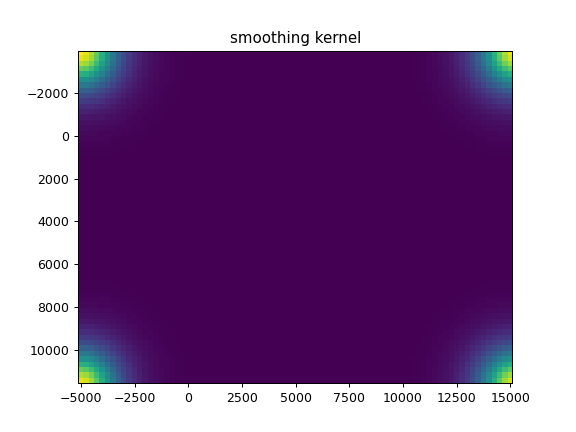

<IPython.core.display.Javascript object>


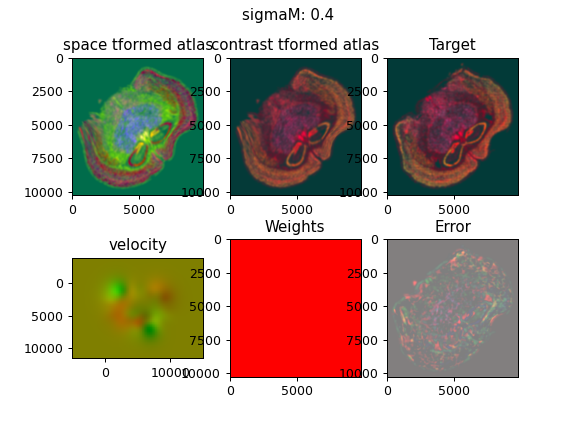

<IPython.core.display.Javascript object>


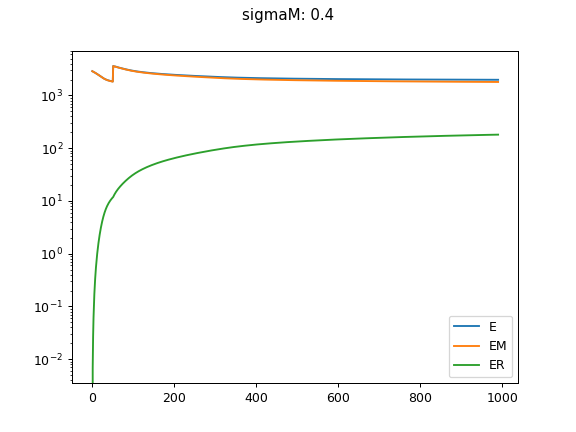

<IPython.core.display.Javascript object>


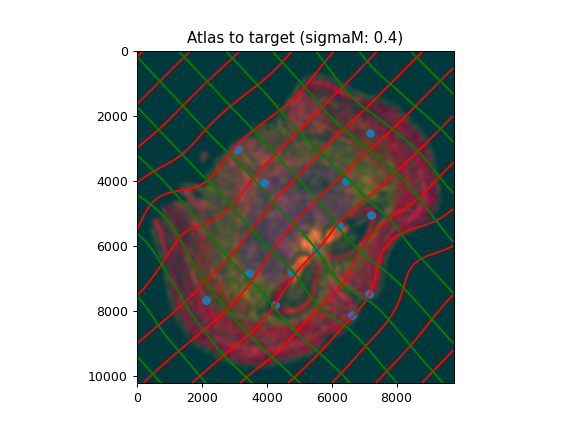

<IPython.core.display.Javascript object>


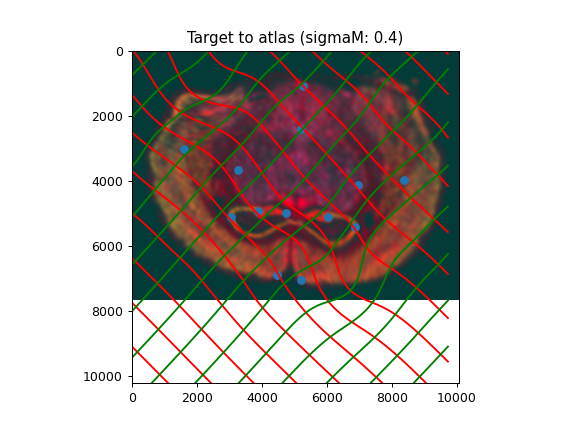


sigmaM of 0.4
time: 2:15:17.932138


<IPython.core.display.Javascript object>


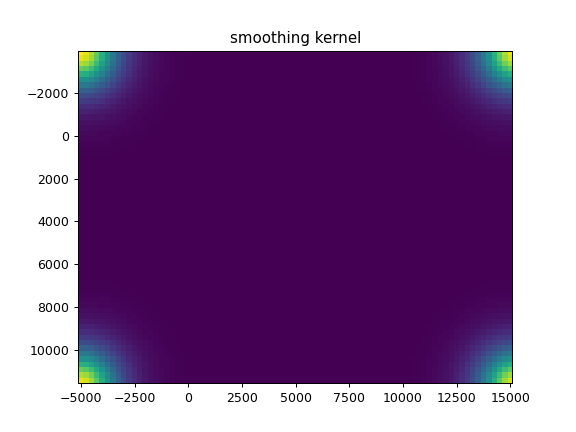

<IPython.core.display.Javascript object>


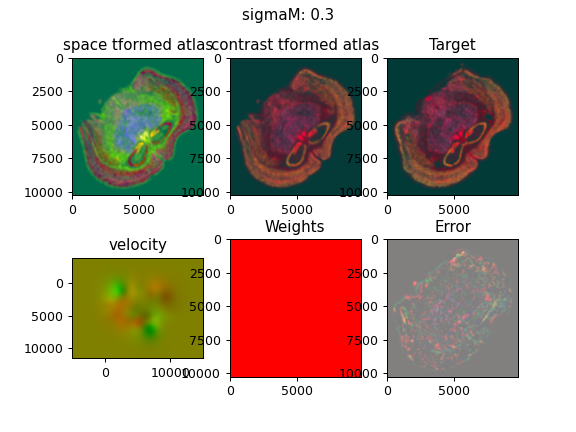

<IPython.core.display.Javascript object>


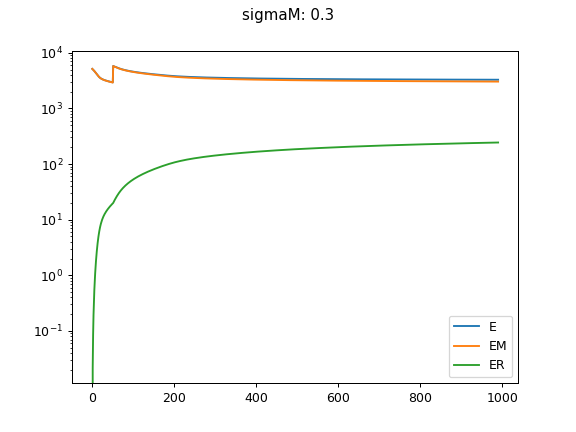

<IPython.core.display.Javascript object>


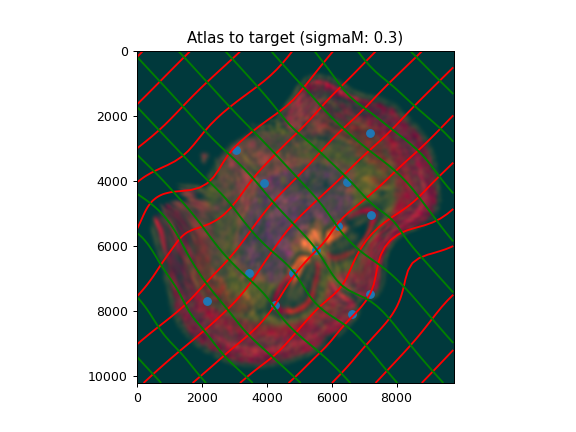

<IPython.core.display.Javascript object>


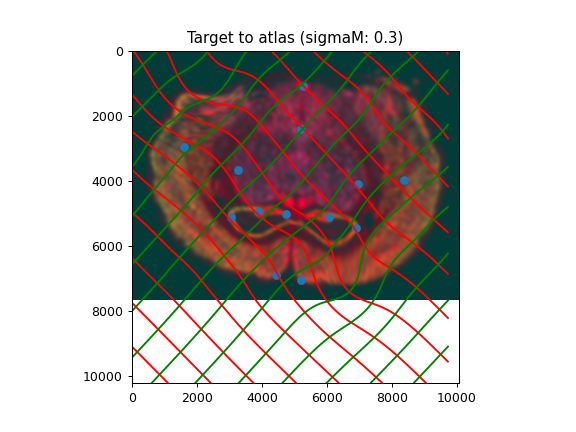


sigmaM of 0.3
time: 2:17:59.367153


<IPython.core.display.Javascript object>


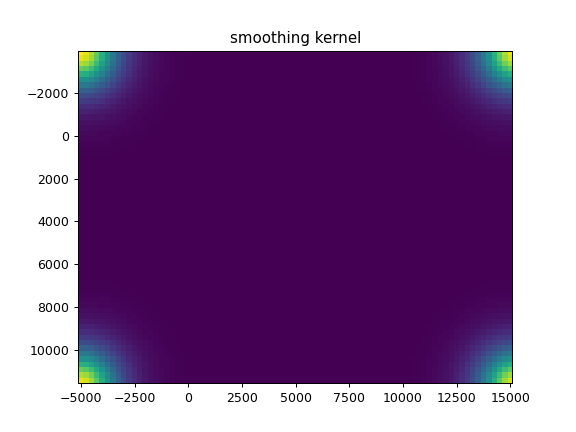

<IPython.core.display.Javascript object>


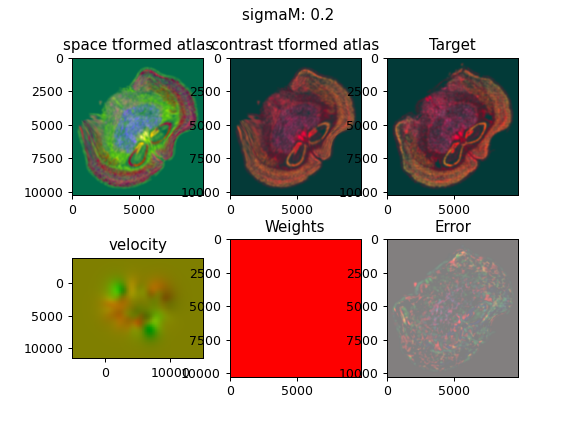

<IPython.core.display.Javascript object>


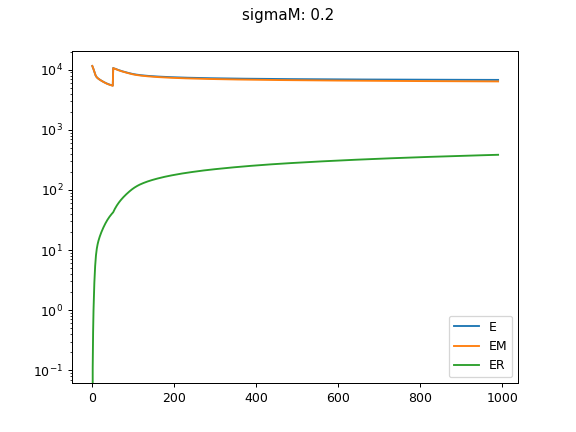

<IPython.core.display.Javascript object>


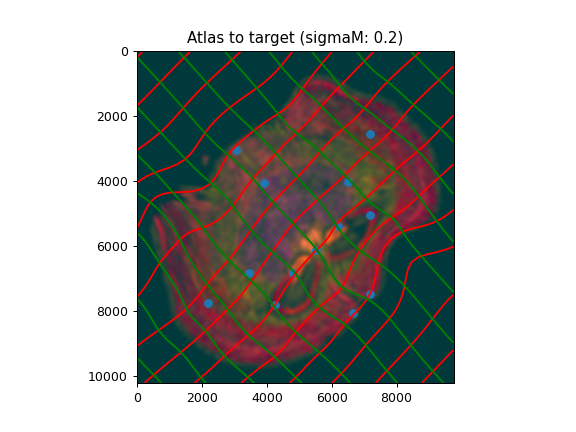

<IPython.core.display.Javascript object>


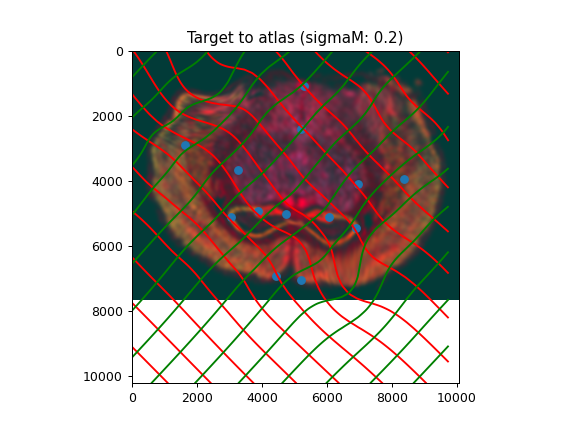


sigmaM of 0.2
time: 2:19:37.579332


<IPython.core.display.Javascript object>


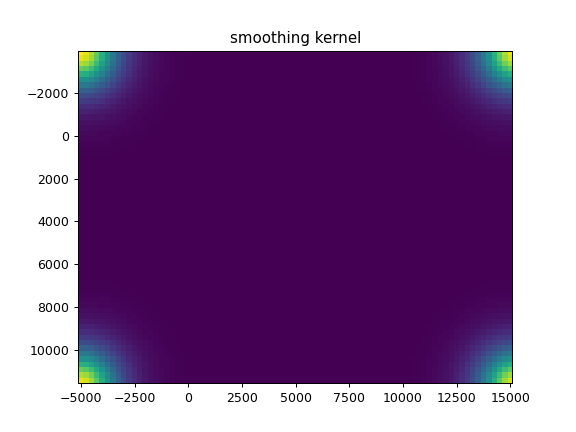

<IPython.core.display.Javascript object>


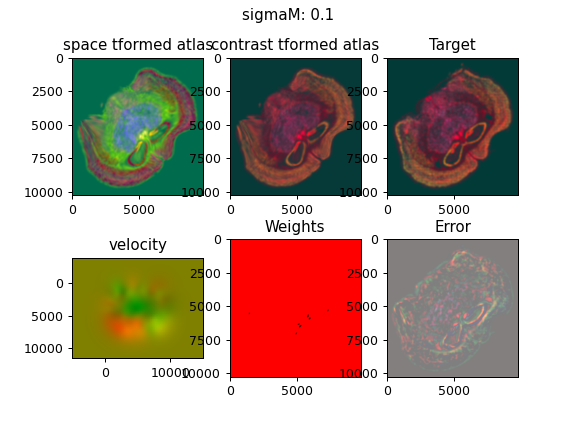

<IPython.core.display.Javascript object>


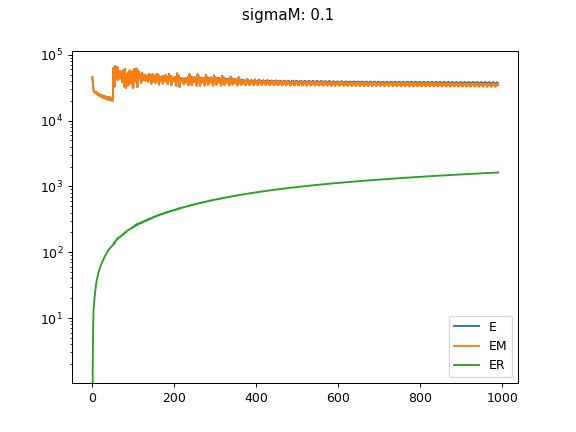

<IPython.core.display.Javascript object>


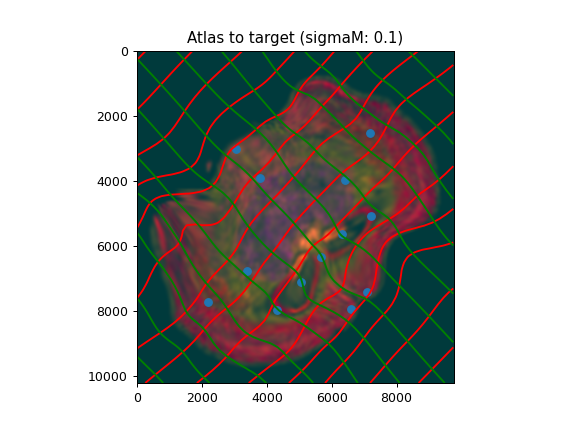

<IPython.core.display.Javascript object>


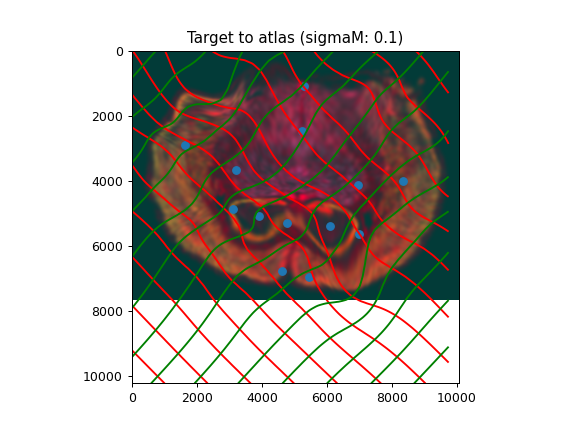


sigmaM of 0.1
time: 2:26:54.221340


In [10]:
imp.reload(tools)
#runs registration for decreasing values of sigmaM
for sigmaM in np.arange(1.0,0,-0.1):
    start = time.time()

    #LDDMM
    device = 'cpu'
    sigmaM = round(sigmaM,1)
    label = f"sigmaM: {sigmaM}"

    params = {'L':L,'T':T,
              'niter':1000,
              'device':device,
              'sigmaM':sigmaM
              }

    A,v,xv,figInfo,figE = tools.LDDMM([YI,XI],I,[YJ,XJ],J,
                **params)
    figInfo.suptitle(label) #auxInfo
    figE.suptitle(label) #optimization

    #atlas to target transformation
    phiI = tools.transform_image_atlas_to_target(xv,v,A,[YI,XI],I,[YJ,XJ])
    phii = tools.build_transform(xv,v,A,XJ=[YJ,XJ],direction='b')
    levels = np.arange(-100000,100000,1000)

    phipointsI = tools.transform_points_atlas_to_target(xv,v,A,points[i])
    figAtT,ax = plt.subplots()
    ax.imshow(phiI.permute(1,2,0)/torch.max(phiI),extent=extentJ)
    ax.contour(XJ,YJ,phii[...,0],colors='r',linestyles='-',levels=levels)
    ax.contour(XJ,YJ,phii[...,1],colors='g',linestyles='-',levels=levels)

    ax.set_aspect('equal')
    ax.set_title(f'Atlas to target ({label})')
    ax.scatter(phipointsI[:,1].detach(),phipointsI[:,0].detach())

    #target to atlas transformation
    phiiJ = tools.transform_image_target_to_atlas(xv,v,A,[YJ,XJ],J,[YI,XI])
    phi = tools.build_transform(xv,v,A,XJ=[YJ,XJ],direction='f')

    phiipointsJ = tools.transform_points_target_to_atlas(xv,v,A,points[j])
    figTtA,ax = plt.subplots()
    ax.imshow(phiiJ.permute(1,2,0)/torch.max(phiiJ),extent=extentI)
    ax.contour(XJ,YJ,phi[...,0],colors='r',linestyles='-',levels=levels)
    ax.contour(XJ,YJ,phi[...,1],colors='g',linestyles='-',levels=levels)

    ax.set_aspect('equal')
    ax.set_title(f'Target to atlas ({label})')
    ax.scatter(phiipointsJ[:,1].detach(),phiipointsJ[:,0].detach())

    #saving
    path = "/nafs/dtward/stalign/registration/"
    name = f"v02_sigmaM_{sigmaM}_S2R3_to_S2R2"

    figE.savefig(f"{path}{name}_Efig.jpg")
    figAtT.savefig(f"{path}{name}_AtTfig.jpg")
    figTtA.savefig(f"{path}{name}_TtAfig.jpg")
    np.savez(f"{path}{name}_transformation_data",A=A,v=v,xv=xv,figInfo=figInfo,figE=figE,
             figAtT=figAtT,figTtA=figTtA,phipointsI=phipointsI,phiipointsJ=phiipointsJ)


    end = time.time()
    print("\nsigmaM of " + str(sigmaM))
    print("time: " + str(datetime.timedelta(seconds=(end - start))))


<IPython.core.display.Javascript object>


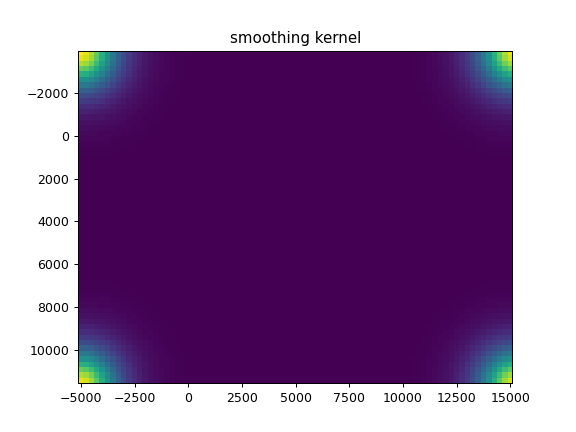

<IPython.core.display.Javascript object>


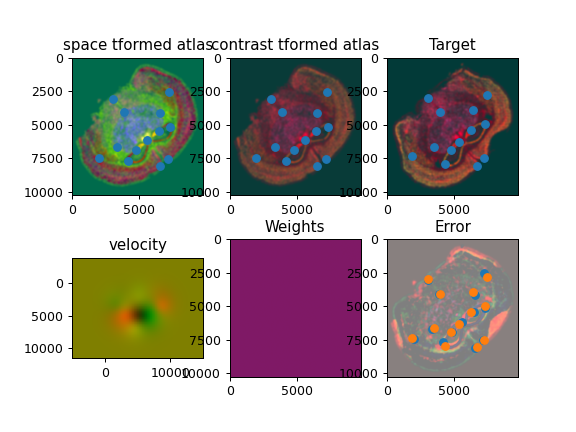

<IPython.core.display.Javascript object>


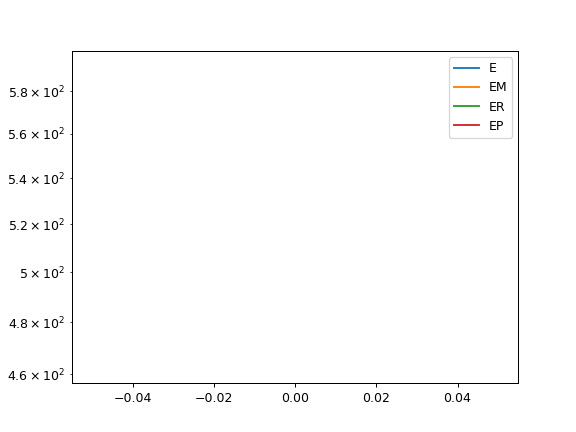

0:01:29.784428


In [17]:
start = time.time()

device = 'cpu'
sigmaM = 1.0
imp.reload(tools)

params = {'L':L,'T':T,
          'pointsI':points[i],
          'pointsJ':points[j],
          'niter':10,
          'device':device,
          'sigmaM':sigmaM
          }

A,v,xv,fig,figE = tools.LDDMM([YI,XI],I,[YJ,XJ],J,
            **params)

end = time.time()
print(str(datetime.timedelta(seconds=(end - start))))

# Test building a transform, forward and backward

In [12]:
imp.reload(tools)
phii = tools.build_transform(xv,v,A,XJ=[YJ,XJ],direction='b')

/ifshome/oamiuwu/rasterization_work/tools.py:1004: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  A = torch.tensor(A)
/ifshome/oamiuwu/rasterization_work/tools.py:1005: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  v = torch.tensor(v)
/ifshome/oamiuwu/rasterization_work/tools.py:1017: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  XJ = torch.tensor(XJ)


<IPython.core.display.Javascript object>


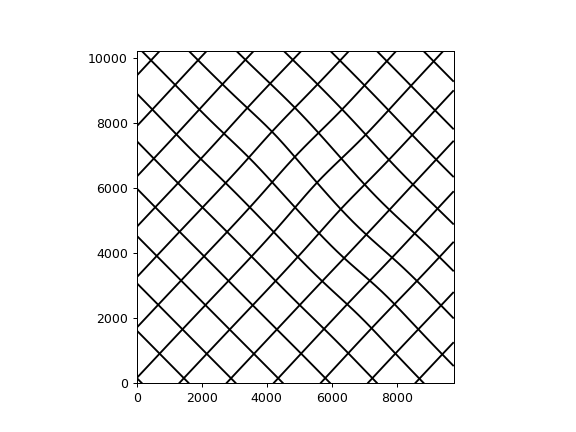

In [51]:
levels = np.arange(-100000,100000,1000)
fig,ax = plt.subplots()
ax.contour(XJ,YJ,phii[...,0],colors='k',linestyles='-',levels=levels)
ax.contour(XJ,YJ,phii[...,1],colors='k',linestyles='-',levels=levels)
ax.set_aspect('equal')

# Apply transform to atlas image

<IPython.core.display.Javascript object>


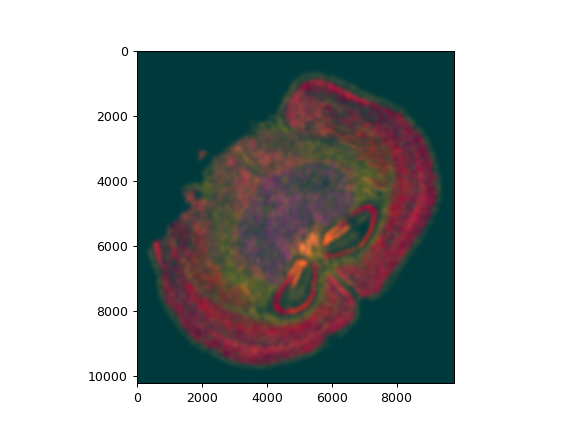

In [52]:
imp.reload(tools)
phiI = tools.transform_image_atlas_to_target(xv,v,A,[YI,XI],I,[YJ,XJ])
fig,ax = plt.subplots()
ax.imshow(phiI.permute(1,2,0)/torch.max(phiI),extent=extentJ)

<IPython.core.display.Javascript object>


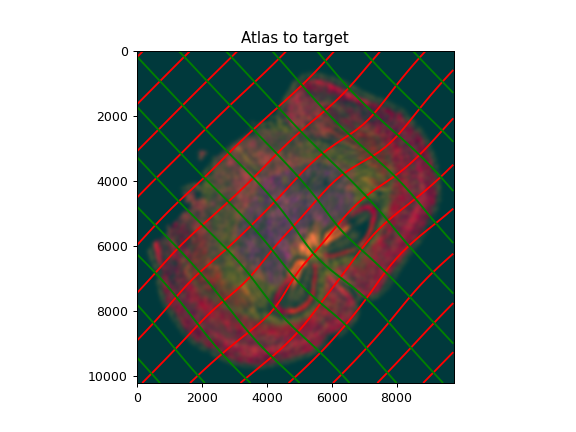

Text(0.5, 1.0, 'Atlas to target')

In [53]:
# build the transform and draw it over
fig,ax = plt.subplots()
ax.imshow(phiI.permute(1,2,0)/torch.max(phiI),extent=extentJ)

phii = tools.build_transform(xv,v,A,XJ=[YJ,XJ],direction='b')
levels = np.arange(-100000,100000,1000)
ax.contour(XJ,YJ,phii[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XJ,YJ,phii[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('Atlas to target')

<IPython.core.display.Javascript object>


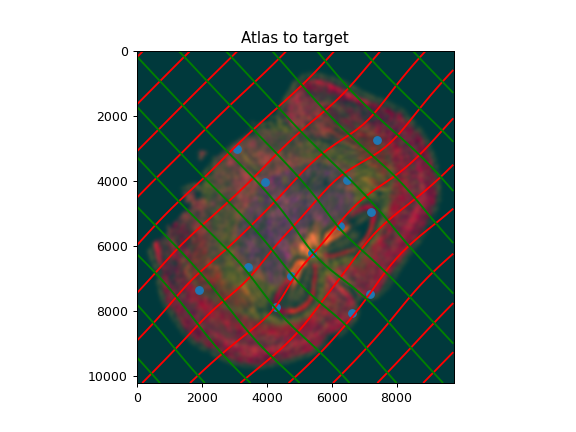

'takes all data in first image and applies spatial map\n1) imaging dataset is interpolation for every pixel in target, \nwhat point did it correspond to in atlas->look up value of atlas image\n2) points: this point located in atlas, using mapping what point does it correspond to in target\nopposite transforms\nlines of coordinate axis of atlas to target. good to look at changes in size/shape of the squares\nmore deformation = anatomical differences\nderivative of mapping = 2x2 matrix\n\n'

In [54]:
# add points
imp.reload(tools)
phipointsI = tools.transform_points_atlas_to_target(xv,v,A,points[i])

fig,ax = plt.subplots()
ax.imshow(phiI.permute(1,2,0)/torch.max(phiI),extent=extentJ)
ax.contour(XJ,YJ,phii[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XJ,YJ,phii[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('Atlas to target')

ax.scatter(phipointsI[:,1].detach(),phipointsI[:,0].detach())
"""takes all data in first image and applies spatial map
1) imaging dataset is interpolation
for every pixel in target, what point did it correspond to in atlas->look up value of atlas image
2) points: this point located in atlas, using mapping what point does it correspond to in target
opposite transforms
lines are coordinate axis of atlas to target. good to look at changes in size/shape of the squares
more deformation = anatomical differences
derivative of mapping = 2x2 matrix

"""

# Apply transform to target image

<IPython.core.display.Javascript object>


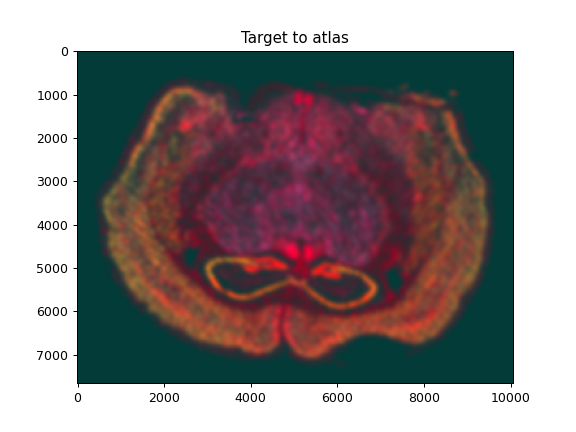

Text(0.5, 1.0, 'Target to atlas')

In [55]:
imp.reload(tools)
phiiJ = tools.transform_image_target_to_atlas(xv,v,A,[YJ,XJ],J,[YI,XI])
fig,ax = plt.subplots()
ax.imshow(phiiJ.permute(1,2,0)/torch.max(phiiJ),extent=extentI)
ax.set_title('Target to atlas')

<IPython.core.display.Javascript object>


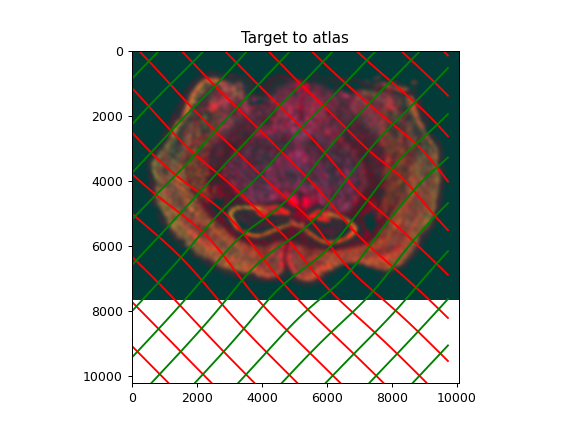

Text(0.5, 1.0, 'Target to atlas')

In [56]:
# build the transform and draw it over
fig,ax = plt.subplots()
ax.imshow(phiiJ.permute(1,2,0)/torch.max(phiiJ),extent=extentI)
phi = tools.build_transform(xv,v,A,XJ=[YJ,XJ],direction='f')
ax.contour(XJ,YJ,phi[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XJ,YJ,phi[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('Target to atlas')

<IPython.core.display.Javascript object>


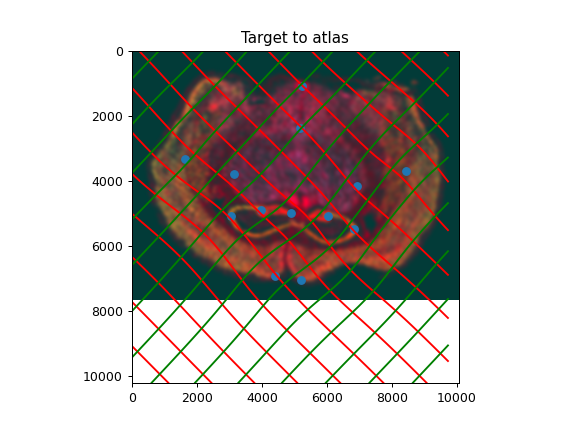

In [57]:
# add points
imp.reload(tools)
phiipointsJ = tools.transform_points_target_to_atlas(xv,v,A,points[j])
fig,ax = plt.subplots()
ax.imshow(phiiJ.permute(1,2,0)/torch.max(phiiJ),extent=extentI)
phi = tools.build_transform(xv,v,A,XJ=[YJ,XJ],direction='f')
ax.contour(XJ,YJ,phi[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XJ,YJ,phi[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('Target to atlas')
ax.scatter(phiipointsJ[:,1].detach(),phiipointsJ[:,0].detach())

Next steps
- will want to compare alignment of cell density vs. pca components vs. varying numbers of pca comps  
- parameters under consideration
  - density vs. genes
  - sigmaM values -> 0.2
  - number of componenets -> 1-10
- experiements
  - evaluate accuracy under different conditions
  - accuracy measure: TRE for linear only and TRE for deformation
  - density, 1 PC, 2 PC, ... 10 PCs (imshow wont take more than 3 dimensions for array, must find solution)
- accuracy
  - y = TRE, x = # PCs, peak where accuracy is at its best (optimal)
  - show that optimal is less than line created by density
  
  
sigmaM - control tradeoff between accruacy and regularity (smoothness)  
small sigmaM increased accuracy at the cost of smoothness (more wiggles for green/red hashlines)  
  
[L    T] affine transformation  
[0  0 1]  
L=upper left  
T = upper right  
TRE for 3 slices, find mean and std across replicates for error bar plot  
np.linalg.inv  
L@points[i] + T  

# Questions